# Predicting Parkinson's Disease using Voice Signal Features
## Michael Jones

In [ ]:
#from autoviz.AutoViz_Class import AutoViz_Class
import pycaret.classification as pc
from pycaret.classification import get_config

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import shap
import lime
from lime import lime_tabular
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

%matplotlib inline


### Read Data

In [2]:
df = pd.read_csv("DB_Voice_Features.csv")

df = df.drop(columns=['name'])

df.head()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,0.02182,0.03130,0.02971,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,0.03134,0.04518,0.04368,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,0.02757,0.03858,0.03590,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,0.02924,0.04005,0.03772,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,0.03490,0.04825,0.04465,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


### EDA

Shape of your Data Set loaded: (195, 23)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    22 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################
Number of variables = 22 exceeds limit, finding top 20 variables through XGBoost
    No categorical feature reduction done. All 0 Categorical vars selected 
    Removing correlated variables from 22 numerics using SULO method
    Adding 0 categorical variables to reduced numeric variables  of 9
############## F E A T U R E   S E L E C T I O N  ####################
Current number of predictors = 9 
    Finding Important Features using Boosted Trees algorithm...
   

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
PPE,float64,0.000000,NA,0.044539,0.527367,Column has 5 outliers greater than upper bound (0.43) or lower than lower bound(-0.04). Cap them or remove them.
MDVP:Fo(Hz),float64,0.000000,NA,88.333000,260.105000,No issue
HNR,float64,0.000000,NA,8.441000,33.047000,Column has 3 outliers greater than upper bound (33.89) or lower than lower bound(10.38). Cap them or remove them.
spread2,float64,0.000000,NA,0.006274,0.450493,Column has 2 outliers greater than upper bound (0.44) or lower than lower bound(0.02). Cap them or remove them.
RPDE,float64,0.000000,NA,0.256570,0.685151,No issue
MDVP:Fhi(Hz),float64,0.000000,NA,102.145000,592.030000,Column has 11 outliers greater than upper bound (358.22) or lower than lower bound(0.85). Cap them or remove them.
D2,float64,0.000000,NA,1.423287,3.671155,Column has 1 outliers greater than upper bound (3.44) or lower than lower bound(1.29). Cap them or remove them.
MDVP:Flo(Hz),float64,0.000000,NA,65.476000,239.170000,Column has 9 outliers greater than upper bound (223.61) or lower than lower bound(0.70). Cap them or remove them.
DFA,float64,0.000000,NA,0.574282,0.825288,No issue
status,int64,0.000000,1,0.000000,1.000000,Target column


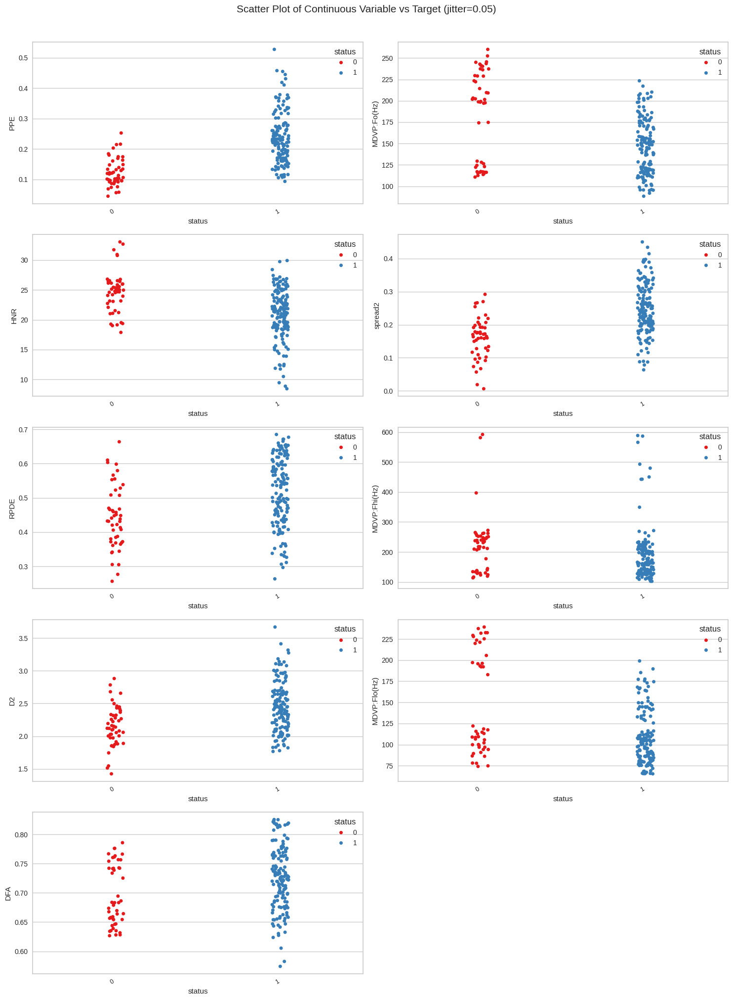

Total Number of Scatter Plots = 45


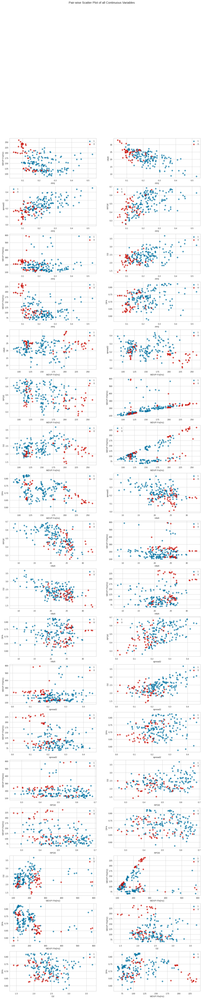

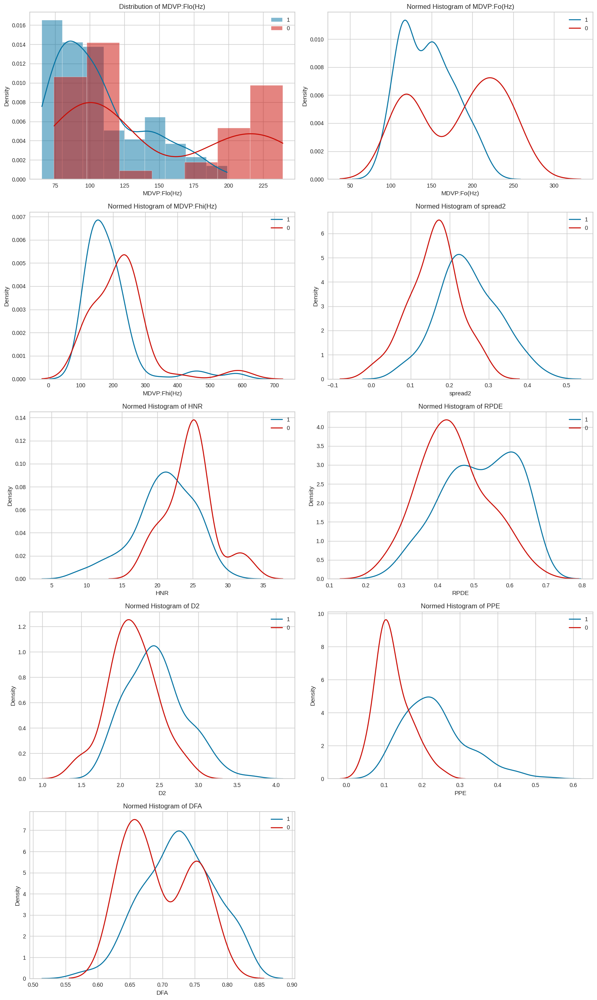

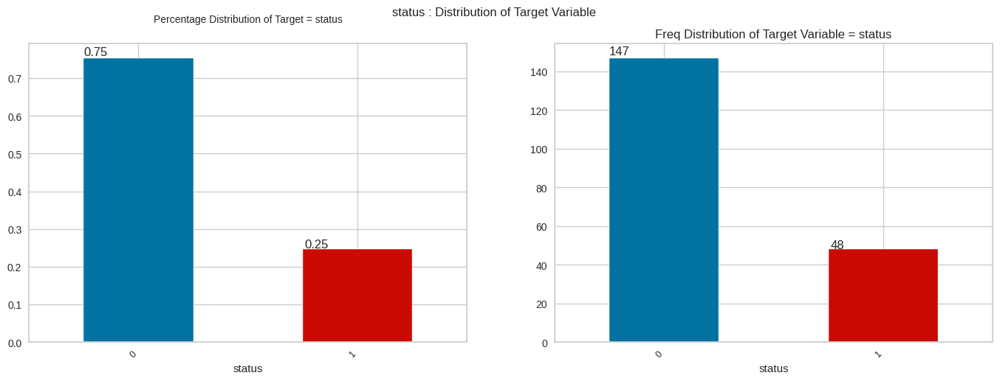

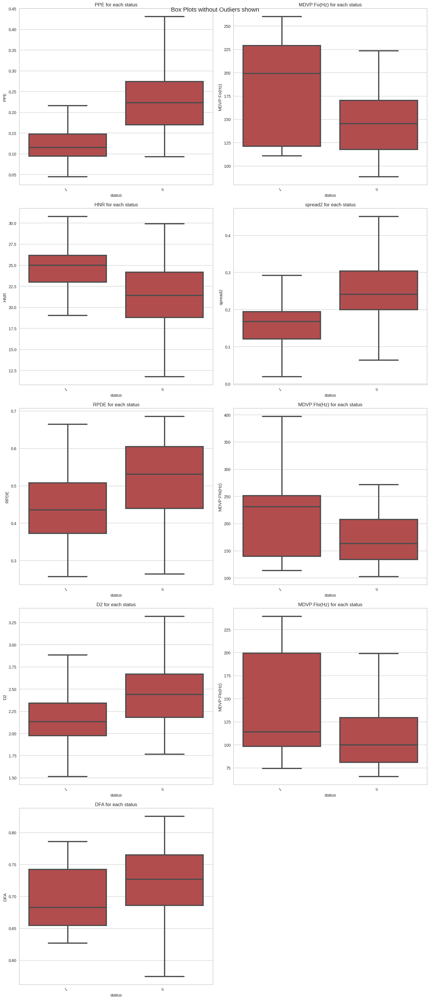

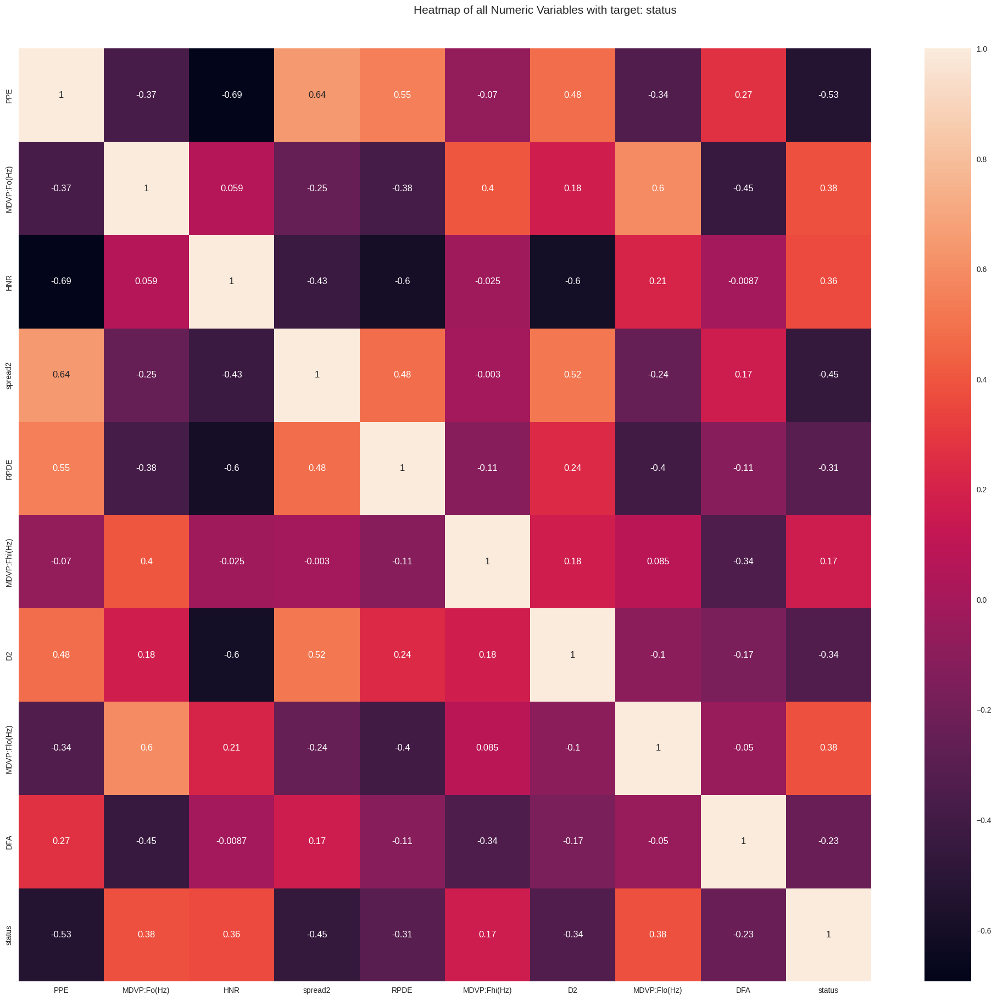

All Plots done
Time to run AutoViz = 29 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [3]:
# Create AutoViz object
AV = AutoViz_Class()

# Generate a compact EDA report with minimal visuals
df_av = AV.AutoViz(
    filename="",                 # Leave empty if you're passing a DataFrame directly
    dfte=df,            # Your DataFrame
    depVar='status',            # Target variable
    verbose=0,                  # 0 = minimal output, 1 = full output
    chart_format='png',         # Format for charts
    lowess=False,               # Skip Lowess plots
    max_rows_analyzed=200,      # To keep it fast
    max_cols_analyzed=20        # Reduce number of variables analyzed
)

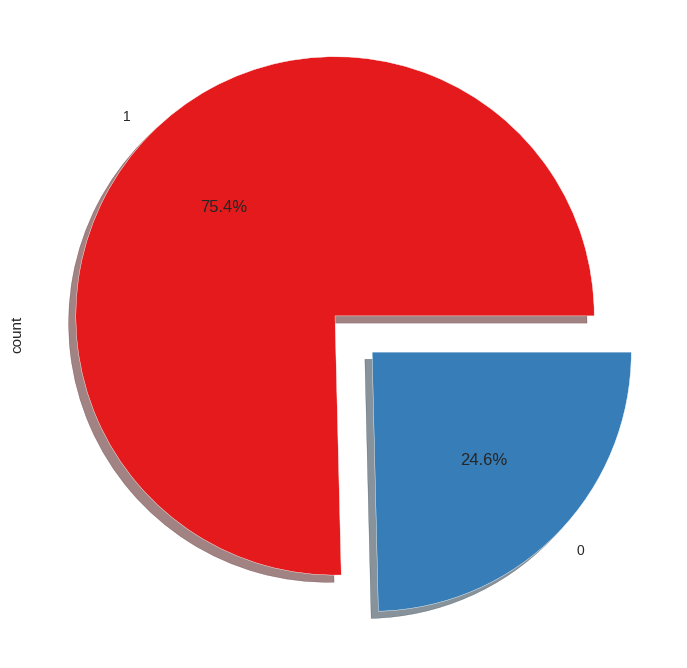

In [4]:
df['status'].value_counts().plot.pie(explode=[0.1,0.1],autopct='%1.1f%%',shadow=True,figsize=(10,8))
plt.show()

### Split and Balance

In [5]:
# Separate features (x) and target (y)
x = df.drop(columns=['status'])
y = df['status']


Class Distribution after SMOTE:
status
0    118
1    118
Name: count, dtype: int64


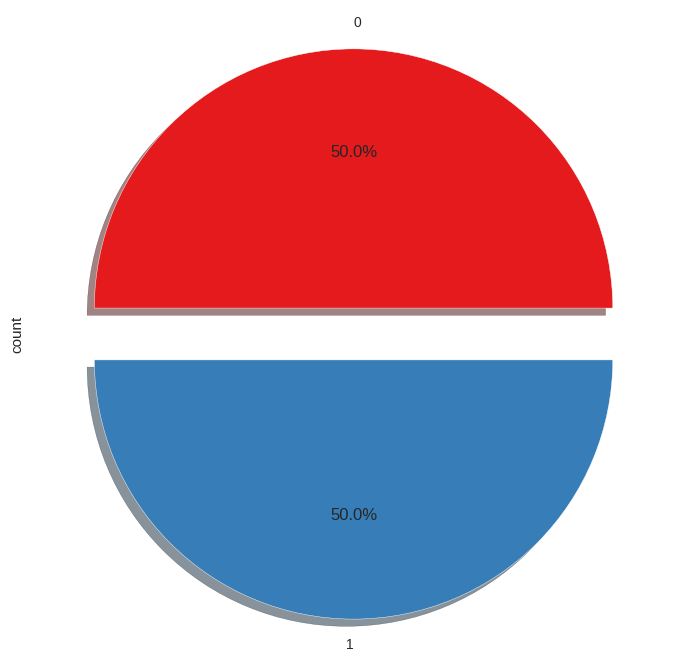

In [6]:
# Split the data into training and testing sets before applying SMOTE
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
x_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)

# Combine the resampled training features and target into a DataFrame for Pycaret
train_df_resampled = pd.concat([x_train_resampled, y_train_resampled], axis=1)

print("\nClass Distribution after SMOTE:")
print(y_train_resampled.value_counts())

train_df_resampled['status'].value_counts().plot.pie(explode=[0.1,0.1],autopct='%1.1f%%',shadow=True,figsize=(10,8))
plt.show()

### Pycaret

In [7]:
# Initialize the Pycaret setup
s = pc.setup(data=train_df_resampled, target='status', session_id=42, train_size=0.8, fold=5)

# Compare different models
best_model = pc.compare_models()

,Description,Value
0,Session id,42
1,Target,status
2,Target type,Binary
3,Original data shape,"(236, 23)"
4,Transformed data shape,"(236, 23)"
5,Transformed train set shape,"(188, 23)"
6,Transformed test set shape,"(48, 23)"
7,Numeric features,22
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9627,0.9915,0.9474,0.9778,0.9622,0.9255,0.9262,0.0960
et,Extra Trees Classifier,0.9575,0.9943,0.9579,0.9575,0.9558,0.9150,0.9182,0.2340
xgboost,Extreme Gradient Boosting,0.9522,0.9909,0.9368,0.9682,0.9513,0.9043,0.9065,0.9080
qda,Quadratic Discriminant Analysis,0.9519,0.9779,1.0000,0.9133,0.9544,0.9039,0.9087,0.0380
gbc,Gradient Boosting Classifier,0.9417,0.9927,0.9158,0.9659,0.9387,0.8834,0.8868,0.2080
rf,Random Forest Classifier,0.9256,0.9819,0.8830,0.9634,0.9188,0.8511,0.8570,0.2200
ada,Ada Boost Classifier,0.8939,0.9621,0.8526,0.9306,0.8891,0.7879,0.7917,0.1380
dt,Decision Tree Classifier,0.8777,0.8775,0.8181,0.9253,0.8664,0.7550,0.7622,0.0360
lda,Linear Discriminant Analysis,0.8403,0.8915,0.7556,0.9105,0.8247,0.6808,0.6919,0.0380
knn,K Neighbors Classifier,0.8347,0.9174,0.7772,0.8791,0.8240,0.6695,0.6751,0.0380


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [8]:
# Print the best model
print(f"\nBest Model identified by Pycaret: {best_model}")

# Train the best model on the entire resampled training data
final_model = pc.finalize_model(best_model)

print(final_model.named_steps.keys())

# Make predictions on the test set
predictions = pc.predict_model(final_model, data=x_test)

# Evaluate the model on the test set
print("\nEvaluation Metrics on Test Set:")
print(pc.evaluate_model(final_model))

display(predictions.head())

# Convert predictions to a Pandas Series for easier handling
predictions_series = pd.Series(predictions['prediction_score'], index=x_test.index)


Best Model identified by Pycaret: LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)
dict_keys(['numerical_imputer', 'categorical_imputer', 'clean_column_names', 'actual_estimator'])



Evaluation Metrics on Test Set:


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

None


,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE,prediction_label,prediction_score
185,116.286003,177.291000,96.983002,0.00314,0.00003,0.00134,0.00192,0.00403,0.01564,0.136,...,0.00737,24.198999,0.598515,0.654331,-5.592584,0.133917,2.058658,0.214346,1,0.5111
77,110.568001,125.393997,106.820999,0.00462,0.00004,0.00226,0.00280,0.00677,0.02199,0.197,...,0.00420,25.820000,0.429484,0.816340,-5.391029,0.250572,1.777901,0.232744,1,0.9686
76,112.875999,148.826004,106.981003,0.00500,0.00004,0.00270,0.00289,0.00810,0.03999,0.350,...,0.00905,23.370001,0.489538,0.789977,-5.775966,0.341169,2.007923,0.193918,1,0.9896
113,210.141006,232.705994,185.257996,0.00534,0.00003,0.00321,0.00280,0.00964,0.01680,0.149,...,0.00620,23.671000,0.441097,0.722254,-5.963040,0.250283,2.489191,0.177807,1,0.9716
62,222.235992,231.345001,205.494995,0.00266,0.00001,0.00152,0.00144,0.00457,0.01643,0.145,...,0.00340,25.856001,0.364867,0.694399,-6.966321,0.095882,2.278687,0.103224,0,0.9892


### SHAP

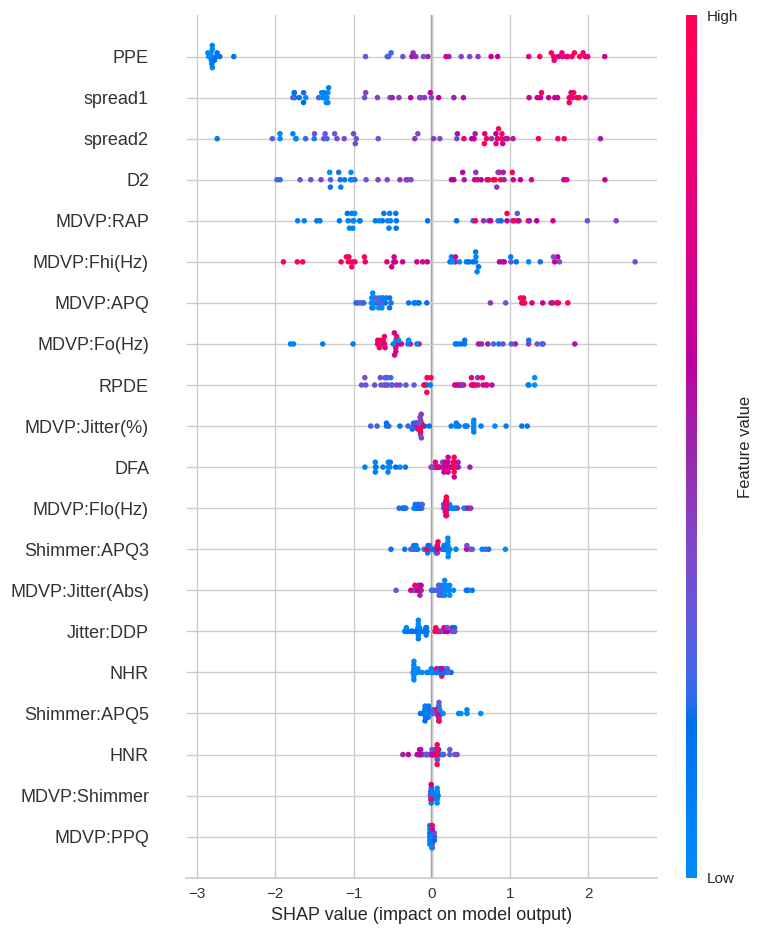

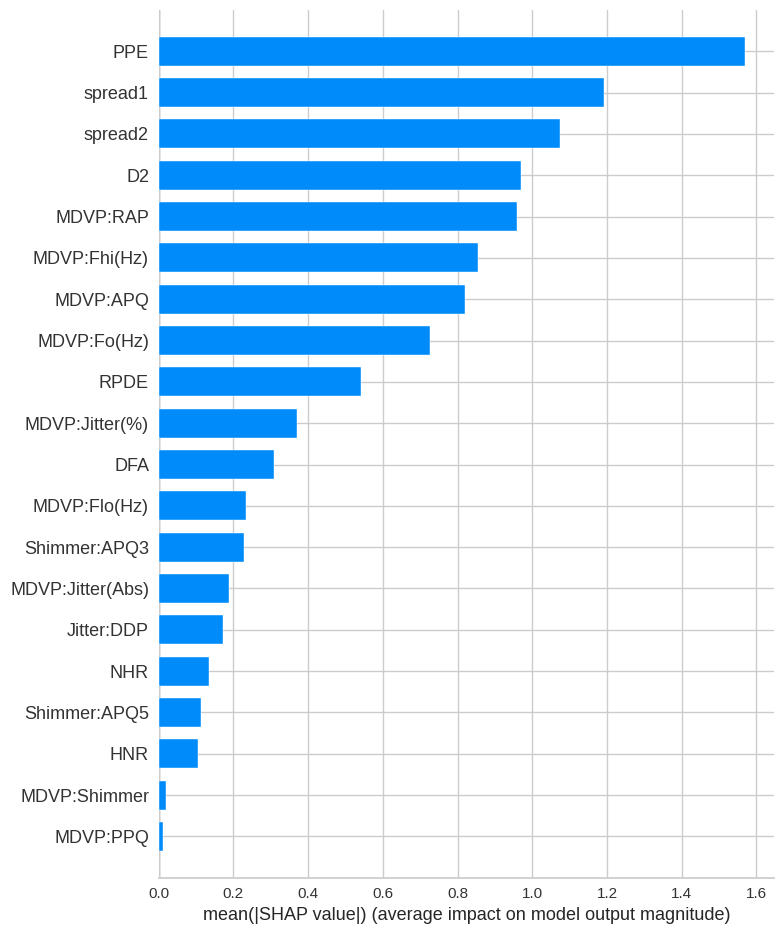

In [9]:
# Extract the final trained estimator from PyCaret pipeline
final_estimator = final_model.named_steps['actual_estimator']

# Get training and test data from PyCaret
X_train = get_config('X_train')
X_test = get_config('X_test')

# Use TreeExplainer for LightGBM
explainer = shap.TreeExplainer(final_estimator)

# Compute SHAP values (use a subset for speed if needed)
shap_values = explainer.shap_values(X_test)

# Plot summary of feature importance
shap.summary_plot(shap_values, X_test, class_names=['Healthy', 'PD'])

shap.summary_plot(shap_values, X_test, plot_type="bar", class_names=["Healthy", "PD"])

### Lime

In [10]:
# Initialize the LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=x_train_resampled.values,  # Use your resampled training data
    feature_names=x_train_resampled.columns,
    class_names=['Healthy', 'PD'],
    mode='classification'
)

for i in range(5):  # You can adjust the range
    print(f"\nGenerating LIME explanation for test instance {i}")

    try:
        # Get the raw test instance and preprocess it
        instance_raw = x_test.iloc[[i]]
        instance_preprocessed = final_model[:-1].transform(instance_raw)

        # Generate explanation
        lime_exp = lime_explainer.explain_instance(
            data_row=instance_preprocessed.values[0],
            predict_fn=final_model.named_steps['actual_estimator'].predict_proba,
            num_features=10
        )

        # Show explanation
        lime_exp.show_in_notebook()

    except Exception as e:
        print(f"Skipping instance {i} due to error: {e}")


Generating LIME explanation for test instance 0



Generating LIME explanation for test instance 1



Generating LIME explanation for test instance 2



Generating LIME explanation for test instance 3



Generating LIME explanation for test instance 4


## Results

In [11]:
print(f"\nBest Model identified by Pycaret: {best_model}")

# 1. Get predictions from PyCaret's model on the original test set
preds = pc.predict_model(final_model, data=x_test)

# 2. Extract true and predicted labels
y_true = y_test
y_pred = preds['prediction_label']  # PyCaret uses 'prediction_label' for final label
y_proba = preds['prediction_score'] # This is the probability of the positive class

# 3. Compute evaluation metrics
acc = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
auc = roc_auc_score(y_true, y_proba)

# 4. Print the metrics
print("\nModel Performance (Best Model from PyCaret):")
print(f"Accuracy: {acc:.2f}")
print(f"Precision (PD): {precision:.2f}")
print(f"Recall (PD): {recall:.2f}")
print(f"F1-score (PD): {f1:.2f}")
print(f"AUC: {auc:.2f}")


Best Model identified by Pycaret: LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)



Model Performance (Best Model from PyCaret):
Accuracy: 0.92
Precision (PD): 0.93
Recall (PD): 0.97
F1-score (PD): 0.95
AUC: 0.52


In [12]:
# 1. Extract raw estimator from the final PyCaret pipeline
final_estimator = final_model.named_steps['actual_estimator']

# 2. Use training data to initialize the SHAP explainer
explainer = shap.Explainer(final_estimator.predict, x_test)

# 3. Calculate SHAP values
shap_values = explainer(x_test)

# 4. Identify and print the top 5 most important features
mean_abs_shap = np.abs(shap_values.values).mean(axis=0)
top_indices = np.argsort(mean_abs_shap)[::-1][:5]
top_features = x_test.columns[top_indices]

print("\nTop 5 Features Contributing to PD Prediction (SHAP):")
for i, feature in enumerate(top_features, 1):
    print(f"{i}. {feature}")


Top 5 Features Contributing to PD Prediction (SHAP):
1. PPE
2. spread2
3. spread1
4. MDVP:Fhi(Hz)
5. MDVP:RAP


## Discussion

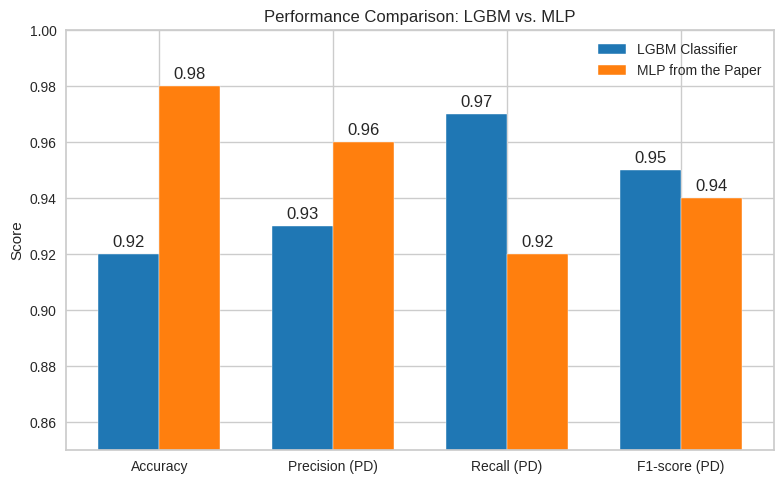

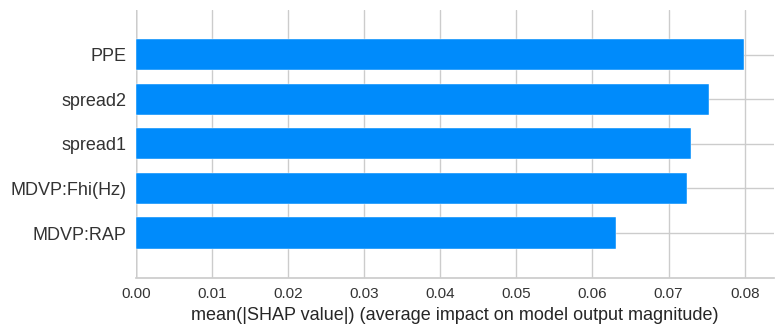

In [13]:
# Metrics and model values
metrics = ['Accuracy', 'Precision (PD)', 'Recall (PD)', 'F1-score (PD)']
lgbm_scores = [0.92, 0.93, 0.97, 0.95]
mlp_scores = [0.98, 0.96, 0.92, 0.94]

# Bar width and positions
x = np.arange(len(metrics))
width = 0.35

# Create plot
fig, ax = plt.subplots(figsize=(8, 5))
bars1 = ax.bar(x - width/2, lgbm_scores, width, label='LGBM Classifier', color='#1f77b4')
bars2 = ax.bar(x + width/2, mlp_scores, width, label='MLP from the Paper', color='#ff7f0e')

# Add text labels
ax.set_ylabel('Score')
ax.set_ylim(0.85, 1.0)
ax.set_title('Performance Comparison: LGBM vs. MLP')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

# Add values on bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # offset text
                    textcoords="offset points",
                    ha='center', va='bottom')

plt.tight_layout()
plt.show()


shap.summary_plot(shap_values, X_test, plot_type="bar",max_display=5, class_names=["Healthy", "PD"])


The paper only used 5 methods: Knearest neighbors (KNN), Support vector machine (SVM), Decision tree (DT), Random forest (RF), and Multilayer perceptron (MLP), whereas we used AutoML which compared many methods. The paper's best method was MLP, whereas ours was LGBMClassifier.

The paper beat us in accuracy and precision, but we beat the paper in recall and F1-score (as seen in the graph above).

Top 5 Features Contributing to PD Prediction (SHAP):

 spread2

 MDVP:Fhi(Hz)

 spread1

 PPE

 MDVP:RAP